In [1]:
import cv2
import dlib
import matplotlib.pyplot as plt
import seaborn
import numpy as np

from os import listdir, path, makedirs
from os.path import isfile, join
import shutil

from sklearn.metrics import accuracy_score

from scipy.spatial import distance as dist

from io import BytesIO
from IPython.display import clear_output, Image, display
from PIL import Image as Img

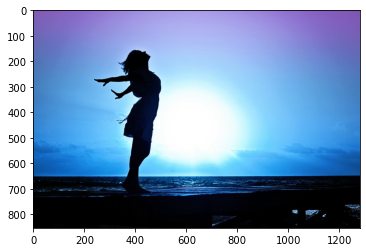

In [2]:
imagem = cv2.imread('imagens/px-girl.jpg')
plt.imshow(imagem)

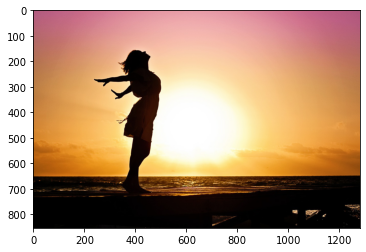

In [3]:
#converting
imagem_rgb = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
plt.imshow(imagem_rgb)

In [4]:
imagem_rgb.shape

(853, 1280, 3)

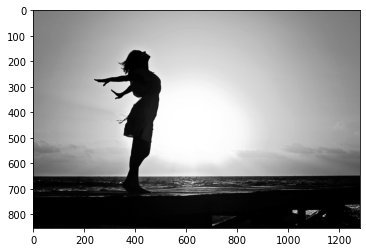

In [5]:
imagem_gray = cv2.cvtColor(imagem_rgb, cv2.COLOR_RGB2GRAY)
plt.imshow(imagem_gray, cmap='gray')

# ROI - Region of Interest

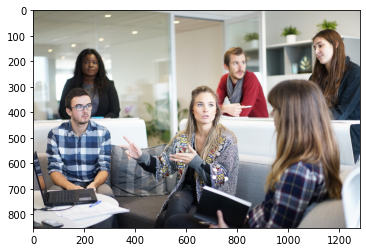

In [6]:
imagem = cv2.imread('imagens/px-people.jpg')

imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
plt.imshow(imagem)

In [7]:
imagem.shape

(853, 1280, 3)

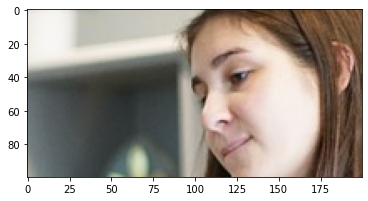

In [8]:
imagem_roi = imagem[100:200, 1000:1200]
plt.imshow(imagem_roi)

In [9]:
cv2.imwrite('imagem_roi.png', imagem_roi)

True

In [10]:
imagem_roi_bgr = cv2.cvtColor(imagem_roi, cv2.COLOR_RGB2BGR)
cv2.imwrite('imagem_roi.png', imagem_roi_bgr)

True

## exerc

Text(0.5, 1.0, 'Garota')

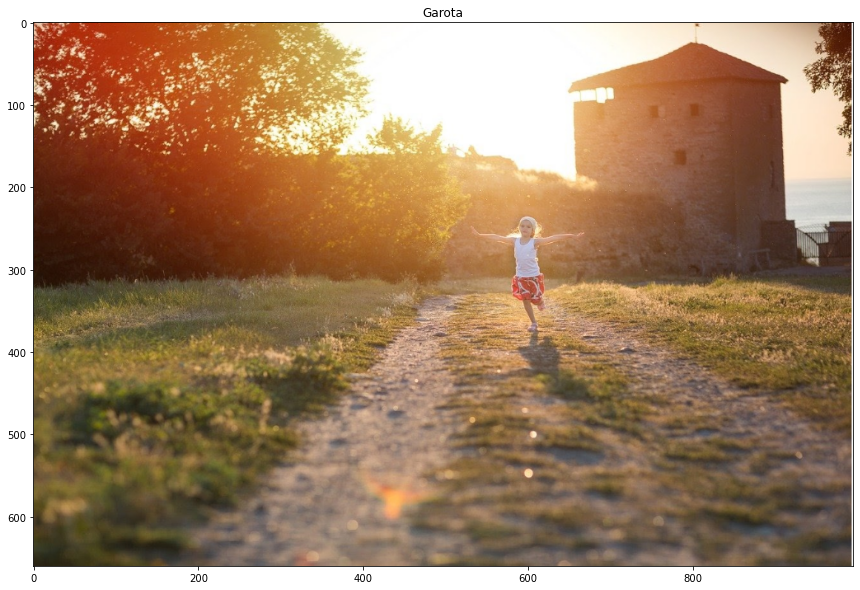

In [11]:
imagem = cv2.imread('1364-img0102.png')
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.imshow(imagem)
plt.title("Garota")

Text(0.5, 1.0, 'Corpo inteiro')

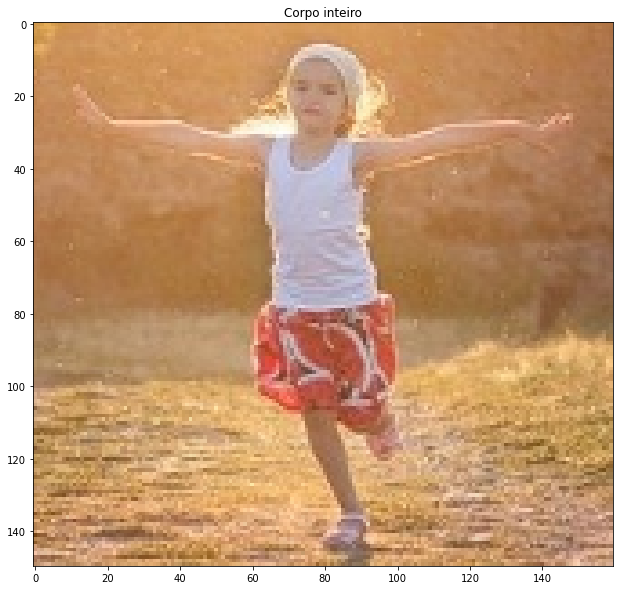

In [12]:
roi = imagem[230:380, 520:680]
plt.figure(figsize=(20,10))
plt.imshow(roi)
plt.title("Corpo inteiro")

Text(0.5, 1.0, 'Corpo inteiro')

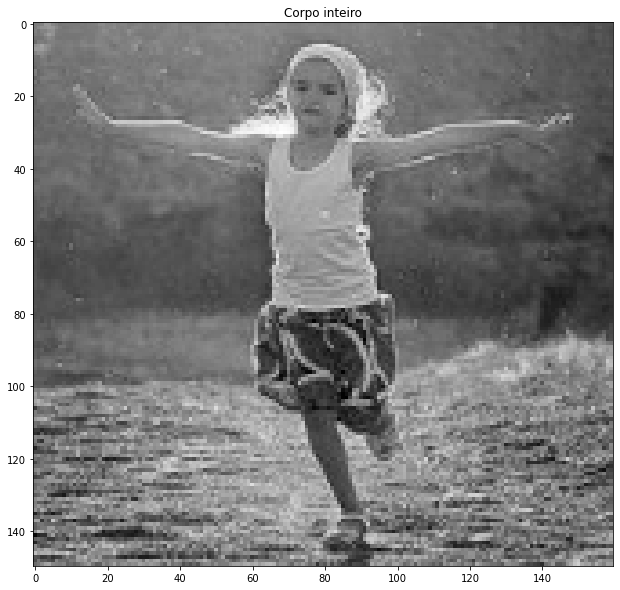

In [13]:
roi_gray = cv2.cvtColor(roi, cv2.COLOR_RGB2GRAY)

plt.figure(figsize=(20,10))
plt.imshow(roi_gray, cmap="gray")
plt.title("Corpo inteiro")

Text(0.5, 1.0, 'Corpo inteiro')

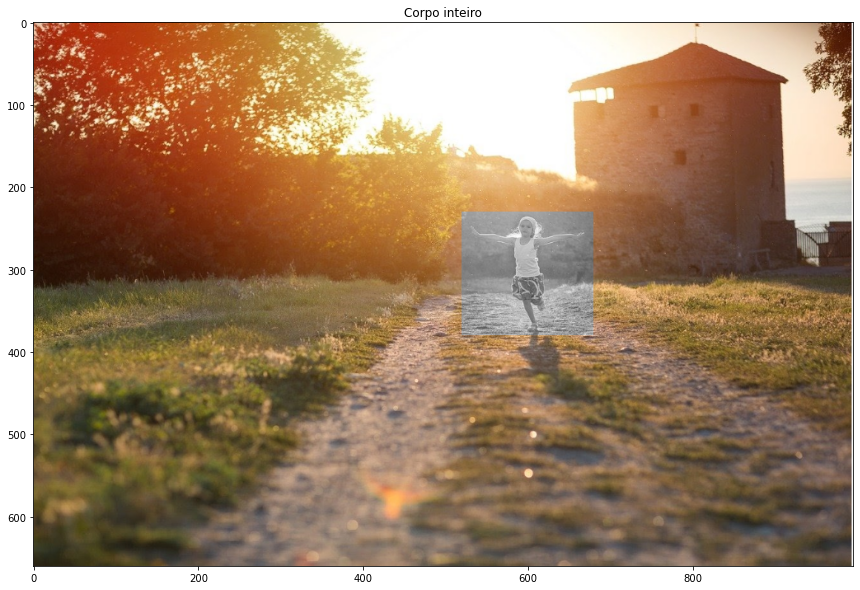

In [14]:
roi_rgb = cv2.cvtColor(roi_gray, cv2.COLOR_GRAY2RGB)
imagem[230:380, 520:680] = roi_rgb

plt.figure(figsize=(20,10))
plt.imshow(imagem)
plt.title("Corpo inteiro")

# Aula 2 - segmentação de faces

## cascata de haar

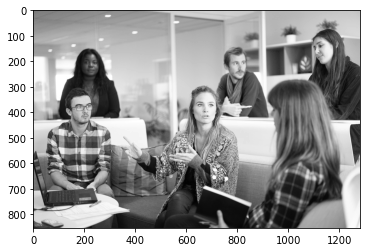

In [15]:
imagem = cv2.imread('imagens/px-people.jpg')
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
imagem_gray = cv2.cvtColor(imagem, cv2.COLOR_RGB2GRAY)
plt.imshow(imagem_gray, cmap='gray')

In [16]:
classificador = cv2.CascadeClassifier('classificadores/haarcascade_frontalface_default.xml')

In [17]:
faces = classificador.detectMultiScale(imagem_gray, 1.3, 5)

In [18]:
len(faces)

5

In [19]:
faces[2]

array([150, 337, 102, 102], dtype=int32)

In [20]:
imagem_anotada = imagem.copy()

In [21]:
for (x,y,w,h) in faces:
    cv2.rectangle(imagem_anotada, (x,y),(x+w, y+h), (255, 255, 0), 2)

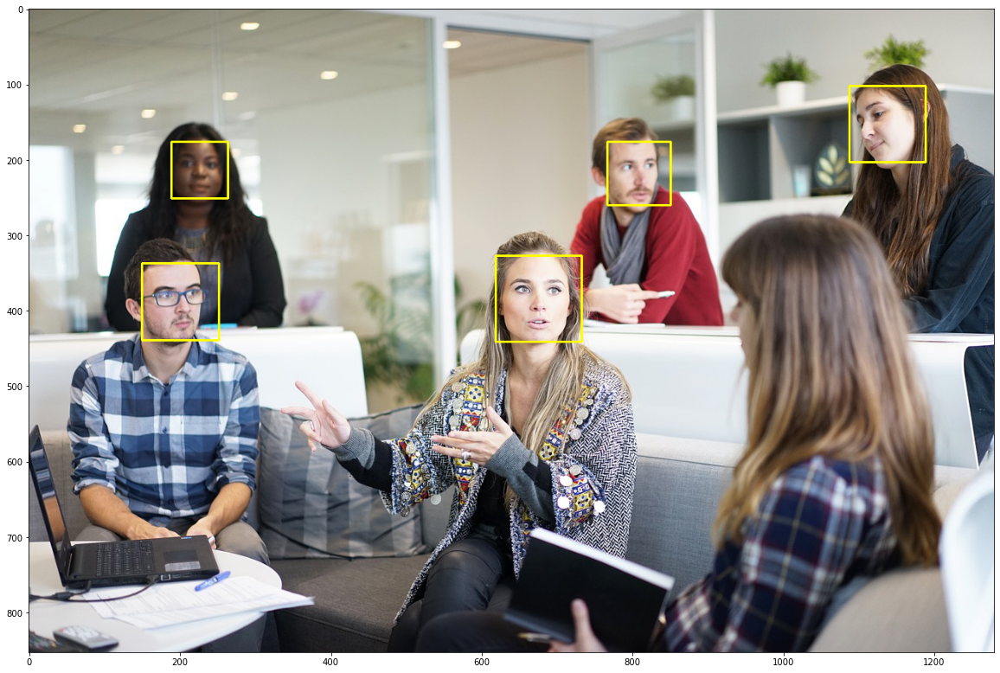

In [22]:
plt.figure(figsize=(20,15))
plt.imshow(imagem_anotada)

In [23]:
face_imagem = 0

for (x,y,w,h) in faces:
    face_imagem += 1
    imagem_roi = imagem[y:y+h, x:x+h]
    imagem_roi = cv2.cvtColor(imagem_roi, cv2.COLOR_RGB2BGR)
    cv2.imwrite('face_' + str(face_imagem) + '.png', imagem_roi)

## exerc 2

Text(0.5, 1.0, 'Pessoa 1')

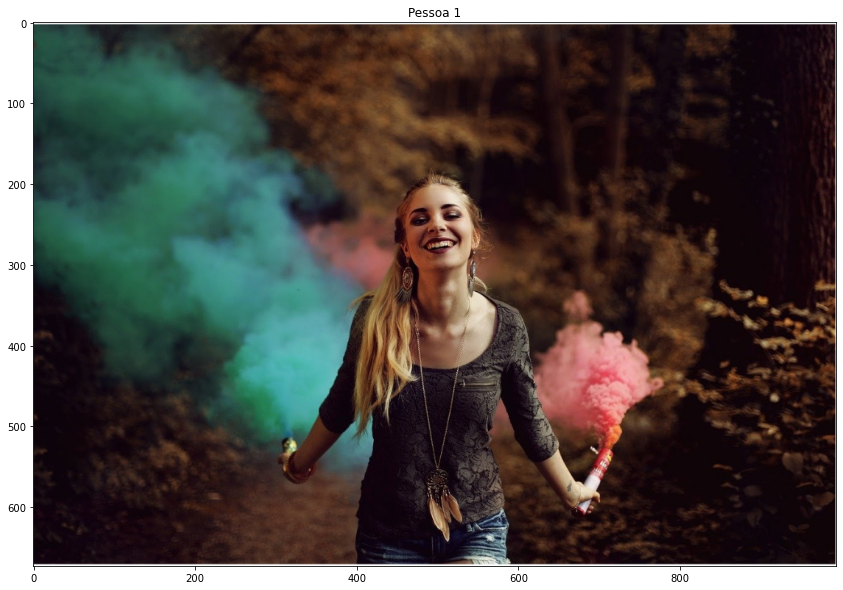

In [24]:
imagem_1 = cv2.imread('exerc2/1.png')
imagem_1 = cv2.cvtColor(imagem_1, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.imshow(imagem_1)
plt.title("Pessoa 1")

Text(0.5, 1.0, 'Pessoa 2')

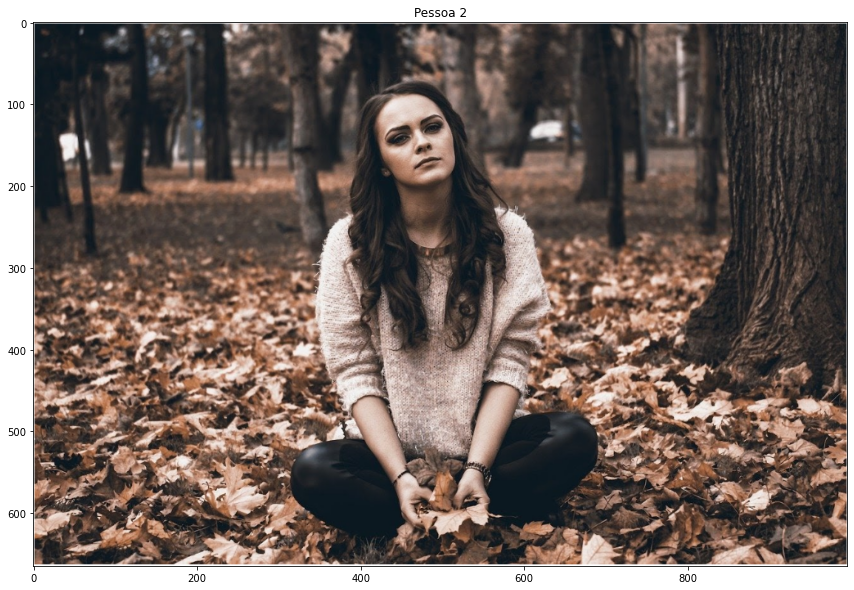

In [25]:
imagem_2 = cv2.imread('exerc2/2.png')
imagem_2 = cv2.cvtColor(imagem_2, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.imshow(imagem_2)
plt.title("Pessoa 2")

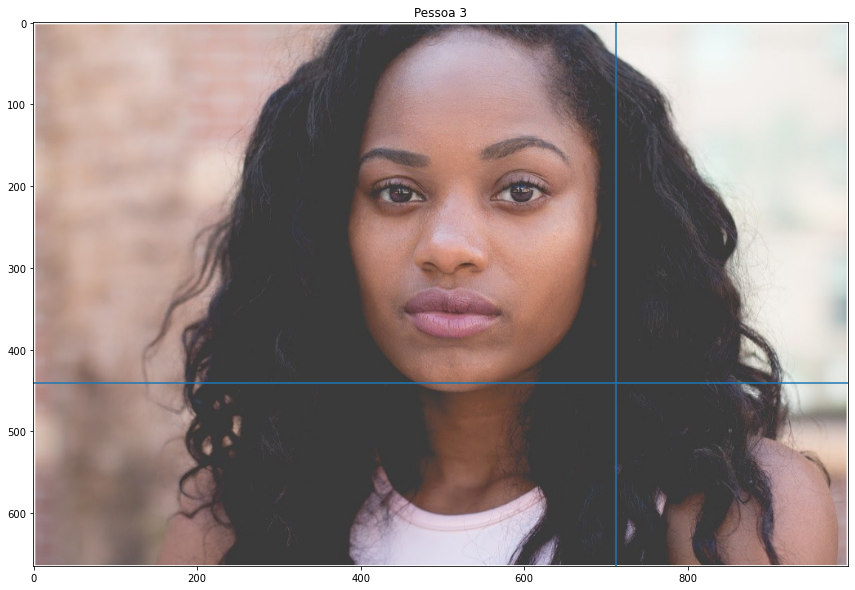

In [26]:
imagem_3 = cv2.imread('exerc2/3.png')
imagem_3 = cv2.cvtColor(imagem_3, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.imshow(imagem_3)
plt.title("Pessoa 3")
plt.axhline(441)
plt.axvline(712)

In [27]:
imagem_1_gray = cv2.cvtColor(imagem_1, cv2.COLOR_RGB2GRAY)
imagem_2_gray = cv2.cvtColor(imagem_2, cv2.COLOR_RGB2GRAY)
imagem_3_gray = cv2.cvtColor(imagem_3, cv2.COLOR_RGB2GRAY)

In [28]:
classificador_face = cv2.CascadeClassifier('classificadores/haarcascade_frontalface_default.xml')

faces_1 = classificador_face.detectMultiScale(imagem_1_gray, 1.3, 5)
print("Faces encontradas: " + str(len(faces_1)))

Faces encontradas: 1


In [29]:
faces_2 = classificador_face.detectMultiScale(imagem_2_gray, 1.3, 5)
print("Faces encontradas: " + str(len(faces_2)))

Faces encontradas: 1


In [30]:
faces_3 = classificador_face.detectMultiScale(imagem_3_gray, 1.3, 5)
print("Faces encontradas: " + str(len(faces_3)))

Faces encontradas: 1


In [31]:
faces_3

array([[324,  53, 388, 388]], dtype=int32)

In [32]:
faces_2

array([[408,  86, 124, 124]], dtype=int32)

In [33]:
faces_1

array([[449, 197, 100, 100]], dtype=int32)

In [34]:
for (x,y,w,h) in faces_1:
    roi_1 = imagem_1[y:y+h, x:x+w]
    
for (x,y,w,h) in faces_2:
    roi_2 = imagem_2[y:y+h, x:x+w]
    
for (x,y,w,h) in faces_3:
    roi_3 = imagem_3[y:y+h, x:x+w]

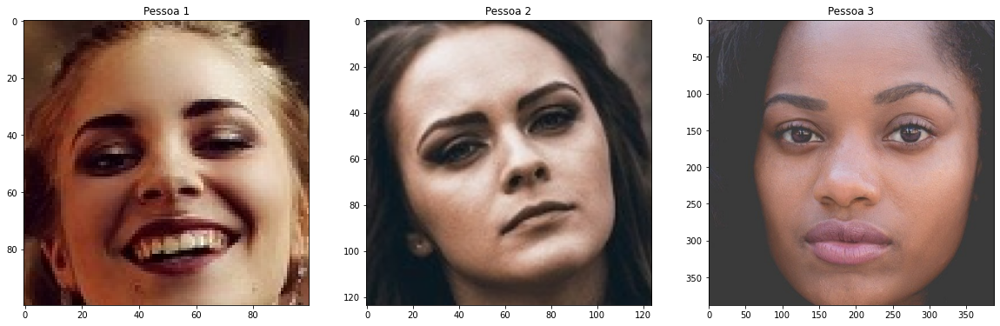

In [35]:
plt.figure(figsize=(20,10))

plt.subplot(131)
plt.title("Pessoa 1")
plt.imshow(roi_1)

plt.subplot(132)
plt.title("Pessoa 2")
plt.imshow(roi_2)

plt.subplot(133)
plt.title("Pessoa 3")
plt.imshow(roi_3)

plt.show()

# Aula 3 - Classificação de faces

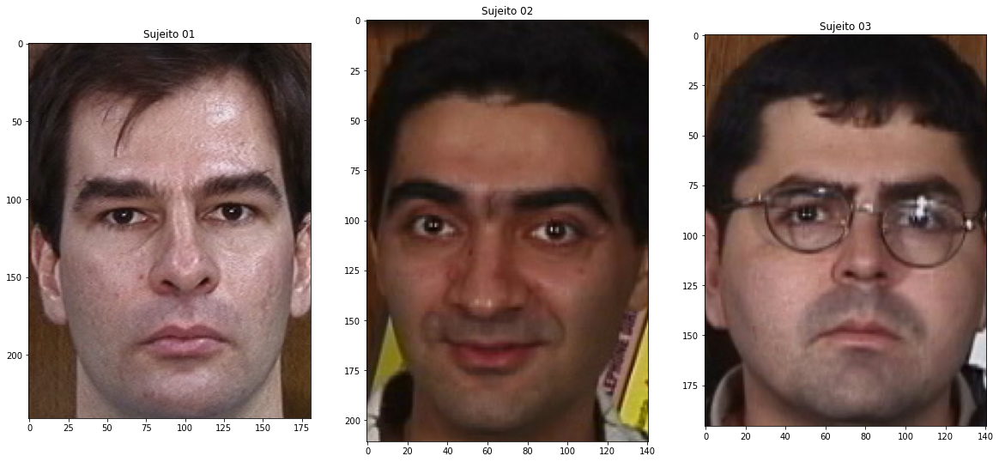

In [36]:
imagem_face_1 = cv2.imread('imagens/cropped_faces/s01_01.jpg')
imagem_face_1 = cv2.cvtColor(imagem_face_1, cv2.COLOR_BGR2RGB)

imagem_face_2 = cv2.imread('imagens/cropped_faces/s02_01.jpg')
imagem_face_2 = cv2.cvtColor(imagem_face_2, cv2.COLOR_BGR2RGB)

imagem_face_3 = cv2.imread('imagens/cropped_faces/s03_01.jpg')
imagem_face_3 = cv2.cvtColor(imagem_face_3, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.subplot(131)
plt.title('Sujeito 01')
plt.imshow(imagem_face_1)

plt.subplot(132)
plt.title('Sujeito 02')
plt.imshow(imagem_face_2)

plt.subplot(133)
plt.title('Sujeito 03')
plt.imshow(imagem_face_3)

plt.show()

## reshape img

In [37]:
faces_caminho = 'imagens/cropped_faces/'

lista_arq_faces = [f for f in listdir(faces_caminho) if isfile(join(faces_caminho, f))]

In [38]:
lista_arq_faces

['s01_01.jpg',
 's01_02.jpg',
 's01_03.jpg',
 's01_04.jpg',
 's01_05.jpg',
 's01_06.jpg',
 's01_07.jpg',
 's01_08.jpg',
 's01_09.jpg',
 's01_10.jpg',
 's01_11.jpg',
 's01_12.jpg',
 's01_13.jpg',
 's01_14.jpg',
 's01_15.jpg',
 's02_01.jpg',
 's02_02.jpg',
 's02_03.jpg',
 's02_04.jpg',
 's02_05.jpg',
 's02_06.jpg',
 's02_07.jpg',
 's02_08.jpg',
 's02_09.jpg',
 's02_10.jpg',
 's02_11.jpg',
 's02_12.jpg',
 's02_13.jpg',
 's02_14.jpg',
 's02_15.jpg',
 's03_01.jpg',
 's03_02.jpg',
 's03_03.jpg',
 's03_04.jpg',
 's03_05.jpg',
 's03_06.jpg',
 's03_07.jpg',
 's03_08.jpg',
 's03_09.jpg',
 's03_10.jpg',
 's03_11.jpg',
 's03_12.jpg',
 's03_13.jpg',
 's03_14.jpg',
 's03_15.jpg',
 's04_01.jpg',
 's04_02.jpg',
 's04_03.jpg',
 's04_04.jpg',
 's04_05.jpg',
 's04_06.jpg',
 's04_07.jpg',
 's04_08.jpg',
 's04_09.jpg',
 's04_10.jpg',
 's04_11.jpg',
 's04_12.jpg',
 's04_13.jpg',
 's04_14.jpg',
 's04_15.jpg',
 's05_01.jpg',
 's05_02.jpg',
 's05_03.jpg',
 's05_04.jpg',
 's05_05.jpg',
 's05_06.jpg',
 's05_07.j

In [39]:
len(lista_arq_faces)

750

In [40]:
faces_path_treino = 'imagens/treino/'
faces_path_teste = 'imagens/teste/'

if not path.exists(faces_path_treino):
    makedirs(faces_path_treino)
    
if not path.exists(faces_path_teste):
    makedirs(faces_path_teste)



for arq in lista_arq_faces:
    sujeito = arq[1:3]
    numero = arq[4:6]
    
    if int(numero) <= 10:
        shutil.copyfile(faces_caminho + arq, faces_path_treino + arq)
    else:
        shutil.copyfile(faces_caminho + arq, faces_path_teste + arq)

In [41]:
def padronizar_imagem(imagem_caminho):
    imagem = cv2.imread(imagem_caminho, cv2.IMREAD_GRAYSCALE)
    imagem = cv2.resize(imagem, (200,200), interpolation=cv2.INTER_LANCZOS4)
    return imagem

In [42]:
list_faces_treino = [f for f in listdir(faces_path_treino) if isfile(join(faces_path_treino, f))]

In [43]:
list_faces_teste = [f for f in listdir(faces_path_teste) if isfile(join(faces_path_teste, f))]

In [44]:
dados_treinamento, sujeitos = [], []

In [45]:
for i, arq in enumerate(list_faces_treino):
    imagem_path = faces_path_treino + arq
    imagem = padronizar_imagem(imagem_path)
    dados_treinamento.append(imagem)
    sujeito = arq[1:3]
    sujeitos.append(int(sujeito))

In [46]:
len(dados_treinamento)

500

In [47]:
len(sujeitos)

500

In [48]:
dados_teste, sujeitos_teste = [], []

In [49]:
for i, arq in enumerate(list_faces_teste):
    imagem_path = faces_path_teste + arq
    imagem = padronizar_imagem(imagem_path)
    dados_teste.append(imagem)
    sujeito = arq[1:3]
    sujeitos_teste.append(int(sujeito))

In [50]:
len(dados_teste)

250

In [51]:
len(sujeitos_teste)

250

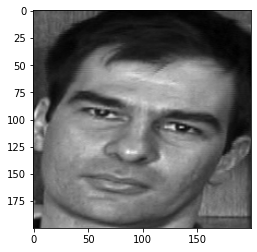

In [52]:
plt.imshow(dados_teste[0], cmap='gray')

# Aula 4 Algoritmos de Classificação de faces

In [53]:
sujeitos = np.asarray(sujeitos, dtype = np.int32)
sujeitos_teste = np.asarray(sujeitos_teste, dtype = np.int32)

In [54]:
modelo_eigenfaces = cv2.face.EigenFaceRecognizer_create()

In [55]:
modelo_eigenfaces.train(dados_treinamento, sujeitos)

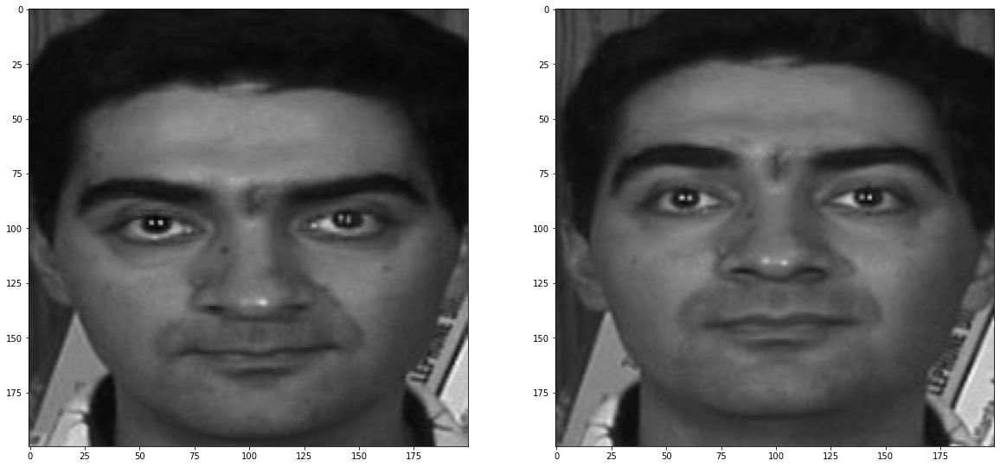

In [56]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.imshow(dados_teste[6], cmap='gray')


plt.subplot(122)
plt.imshow(dados_teste[7], cmap='gray')


plt.show()

In [57]:
predicao = modelo_eigenfaces.predict(dados_teste[6])
predicao

(32, 4817.268663542458)

In [58]:
predicao = modelo_eigenfaces.predict(dados_teste[7])
predicao

(2, 3820.2138342716853)

## fisherfaces

In [59]:
modelo_fisherfaces = cv2.face.FisherFaceRecognizer_create()

In [60]:
modelo_fisherfaces.train(dados_treinamento, sujeitos)

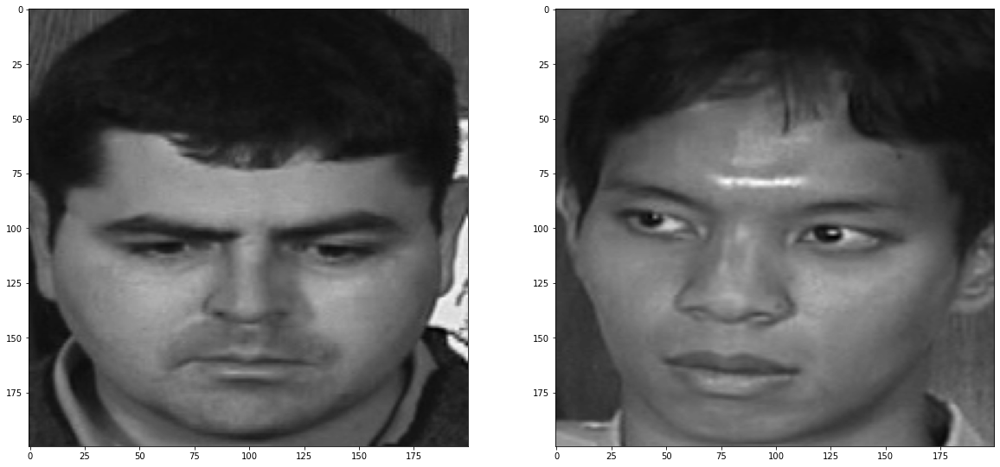

In [61]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.imshow(dados_teste[13], cmap='gray')


plt.subplot(122)
plt.imshow(dados_teste[19], cmap='gray')


plt.show()

In [62]:
predicao = modelo_fisherfaces.predict(dados_teste[13])
predicao

(3, 890.3359324954002)

In [63]:
predicao = modelo_fisherfaces.predict(dados_teste[19])
predicao

(4, 795.1654305178304)

## LBPH

In [65]:
modelo_lbph = cv2.face.LBPHFaceRecognizer_create()

In [66]:
modelo_lbph.train(dados_treinamento, sujeitos)

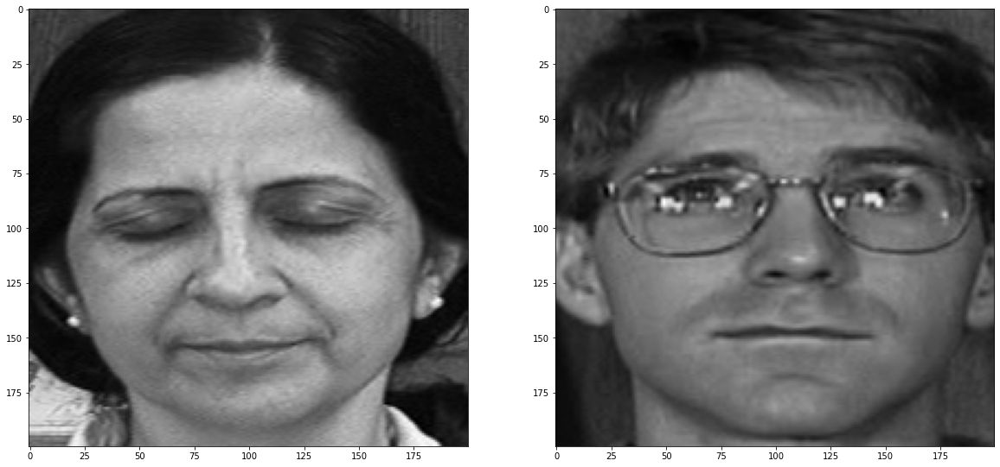

In [67]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.imshow(dados_teste[21], cmap='gray')


plt.subplot(122)
plt.imshow(dados_teste[27], cmap='gray')


plt.show()

In [68]:
predicao = modelo_lbph.predict(dados_teste[21])
predicao

(5, 32.938584374874814)

In [69]:
predicao = modelo_lbph.predict(dados_teste[27])
predicao

(6, 36.49919959564635)

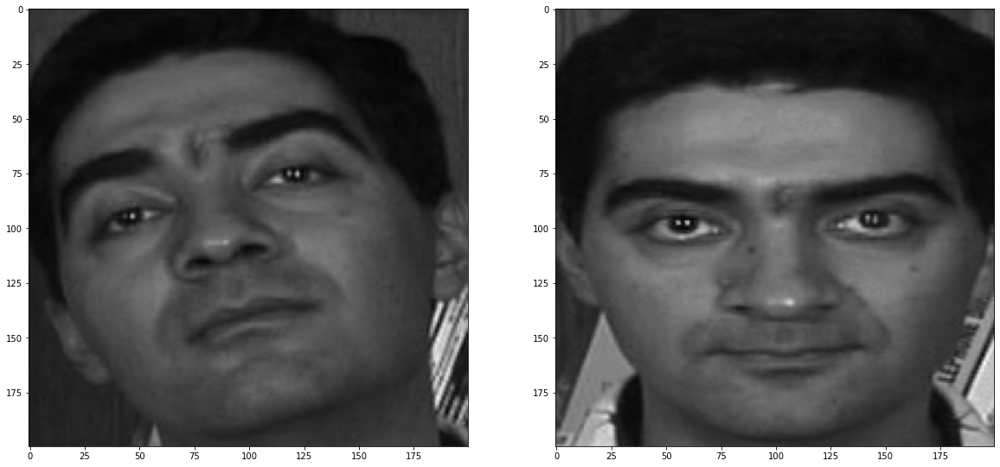

In [70]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.imshow(dados_teste[5], cmap='gray')


plt.subplot(122)
plt.imshow(dados_teste[6], cmap='gray')


plt.show()

## precisao dos algoritmos

In [72]:
y_pred_eigenfaces = []

In [73]:
for item in dados_teste:
    y_pred_eigenfaces.append(modelo_eigenfaces.predict(item)[0])

In [74]:
acuracia_eigenfaces = accuracy_score(sujeitos_teste, y_pred_eigenfaces)

In [75]:
acuracia_eigenfaces

0.724

In [76]:
y_pred_fisherfaces = []
for item in dados_teste:
    y_pred_fisherfaces.append(modelo_fisherfaces.predict(item)[0])

acuracia_fisherfaces = accuracy_score(sujeitos_teste, y_pred_fisherfaces)

acuracia_fisherfaces

0.52

In [78]:
y_pred_lbph = []
for item in dados_teste:
    y_pred_lbph.append(modelo_lbph.predict(item)[0])

acuracia_lbph = accuracy_score(sujeitos_teste, y_pred_lbph)

acuracia_lbph

0.792

In [2]:
from io import BytesIO
from IPython.display import clear_output, Image, display
from PIL import Image as Img

def padronizar_imagem(imagem):
    imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
    imagem = cv2.resize(imagem, (400,300))
    return imagem

def exibir_video(frame):
    img = Img.fromarray(frame, "RGB")
    buffer = BytesIO()
    img.save(buffer, format="JPEG")
    display(Image(data=buffer.getvalue()))
    clear_output(wait=True)

In [3]:
captura_video = cv2.VideoCapture(0)

try:
    while(True):
        captura_ok, frame = captura_video.read()

        if captura_ok:
            frame = padronizar_imagem(frame)
            exibir_video(frame)

except KeyboardInterrupt:
    captura_video.release()
    print("Interrompido")

Interrompido


In [6]:
captura_video = cv2.VideoCapture(0)

classificador_face = cv2.CascadeClassifier('classificadores/haarcascade_frontalface_default.xml')

contador = 0

try:
    while(True):
        captura_ok, frame = captura_video.read()

        if captura_ok:
            frame = padronizar_imagem(frame)
            frame_gray = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)

            faces = classificador_face.detectMultiScale(frame_gray, 1.3, 5)

            if len(faces) > 0:
                contador += 1
                if contador <= 100:
                    for (x,y,w,h) in faces:
                        roi = frame_gray[y:y+h, x:x+w]
                        cv2.resize(roi, (200, 200), interpolation=cv2.INTER_LANCZOS4)
                        cv2.imwrite("imagens/igor/" + str(contador) + ".png", roi)
                    cv2.putText(frame, "Coletado " + str(contador) + " faces", (20,20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)
                else:
                    cv2.putText(frame, "ConcluIdo", (20,20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)

            exibir_video(frame)

except KeyboardInterrupt:
    captura_video.release()
    print("Interrompido")

Interrompido


In [7]:
faces_caminho_treinamento = "imagens/igor/"
lista_faces_treinamento = [f for f in listdir(faces_caminho_treinamento) if isfile(join(faces_caminho_treinamento, f))]

In [8]:
dados_treinamento, sujeitos = [], []

for i, arquivo in enumerate(lista_faces_treinamento):
    imagem_caminho = faces_caminho_treinamento + arquivo
    imagem = cv2.imread(imagem_caminho, cv2.IMREAD_GRAYSCALE)
    dados_treinamento.append(imagem)
    sujeitos.append(0)

sujeitos = np.asarray(sujeitos, dtype=np.int32)

In [9]:
model_lbph = cv2.face.LBPHFaceRecognizer_create()
model_lbph.train(dados_treinamento, sujeitos)

In [11]:
captura_video = cv2.VideoCapture(0)

classificador_face = cv2.CascadeClassifier('classificadores/haarcascade_frontalface_default.xml')

contador = 0

try:
    while(True):
        captura_ok, frame = captura_video.read()

        if captura_ok:
            frame = padronizar_imagem(frame)
            frame_gray = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)
            faces = classificador_face.detectMultiScale(frame_gray, 1.3, 5)

            if len(faces) > 0:
                for (x,y,w,h) in faces:
                    roi = frame_gray[y:y+h, x:x+w]
                    roi = cv2.resize(roi, (200, 200), interpolation=cv2.INTER_LANCZOS4)
                    predicao = model_lbph.predict(roi)
                    cv2.putText(frame, "Similaridade " + str(predicao[1]), (x,y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)

            exibir_video(frame)

except KeyboardInterrupt:
    captura_video.release()
    print("Interrompido")

Interrompido


# Aula 5 Marcos Faciais IDLIB

In [95]:
imagem = cv2.imread('imagens/px-woman-smilings.jpg')
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

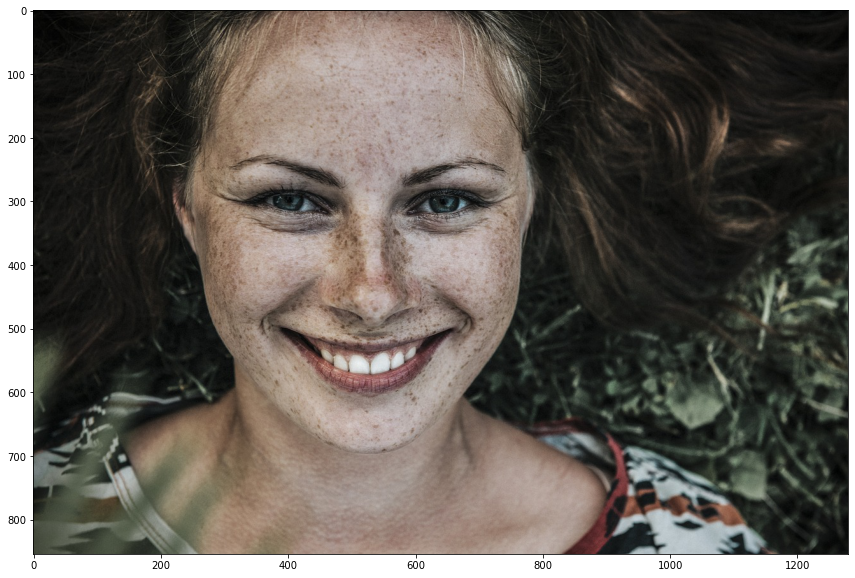

In [96]:
plt.figure(figsize=(20,10))
plt.imshow(imagem)

In [98]:
classificador_dlib_68_path = 'classificadores/shape_predictor_68_face_landmarks.dat'

In [99]:
classificador_dlib = dlib.shape_predictor(classificador_dlib_68_path)

In [100]:
detector_face = dlib.get_frontal_face_detector()

In [112]:
def anotar_rosto(imagem):
    retangulos = detector_face(imagem, 1)
    
    if len(retangulos) == 0:
        return None
    
    for k, d in enumerate(retangulos):
        print('Identificado rosto ' + str(k))
        cv2.rectangle(imagem, (d.left(), d.top()), (d.right(), d.bottom()), (255,255,0), 2)
        
    return imagem

In [113]:
imagem_anotada = imagem.copy()

In [114]:
imagem_anotada = anotar_rosto(imagem_anotada)

Identificado rosto 0


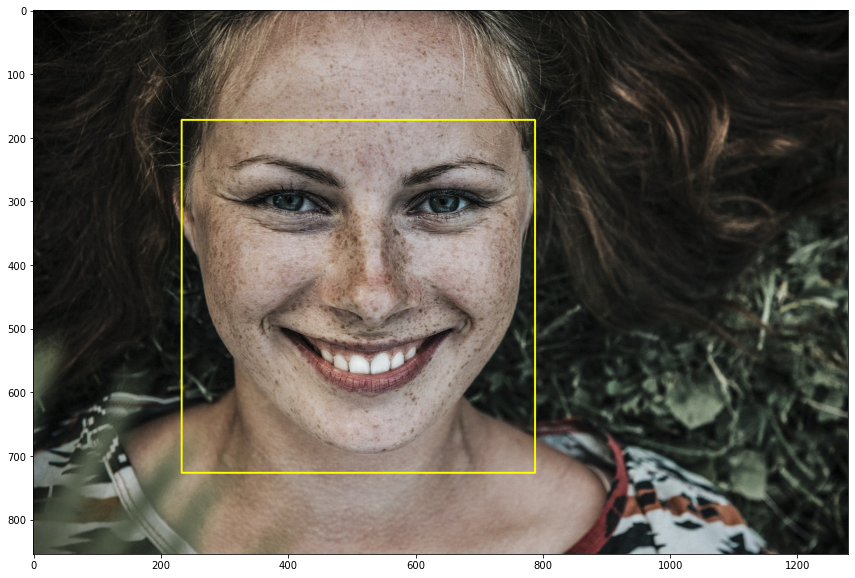

In [115]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_anotada)

In [118]:
def pontos_marcos_faciais(imagem):
    
    retangulos = detector_face(imagem,1)
    if len(retangulos) == 0:
        return None
    
    marcos = []
    
    for ret in retangulos:
        marcos.append(np.matrix([[p.x, p.y] for p in classificador_dlib(imagem, ret).parts()]))
        
    return marcos

In [119]:
marcos_faciais = pontos_marcos_faciais(imagem)

In [120]:
len(marcos_faciais)

1

In [122]:
len(marcos_faciais[0])

68

In [123]:
def anotar_marcos_faciais(imagem, marcos):
    
    for marco in marcos:
        for idx, ponto in enumerate(marco):
            centro = (ponto[0,0], ponto[0,1])
            
            cv2.circle(imagem, centro, 3, (255,255,0), -1)
            cv2.putText(imagem, str(idx), centro, cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255,255,255),2)
            
    return imagem

In [124]:
imagem_anotada = imagem.copy()
imagem_anotada = anotar_marcos_faciais(imagem_anotada, marcos_faciais)

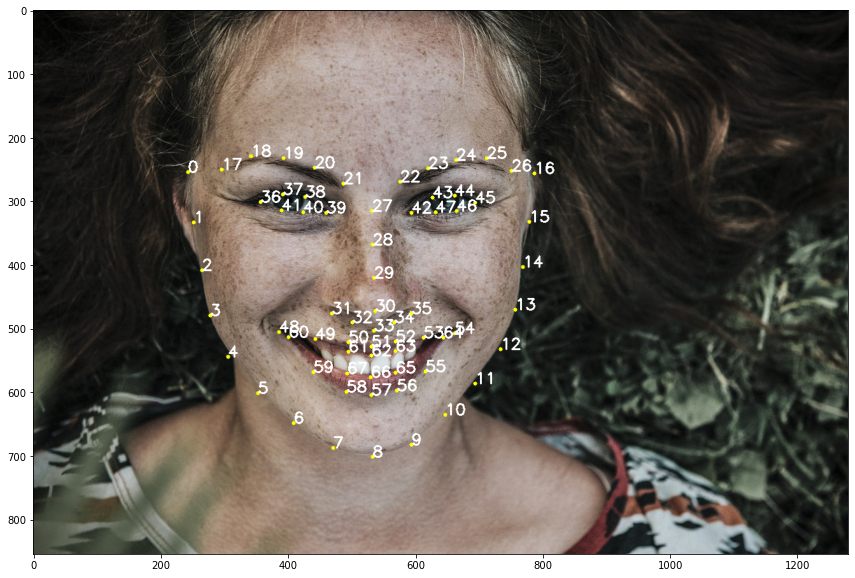

In [125]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_anotada)

In [126]:
imagem_pessoa = cv2.imread('imagens/px-man-happy.jpg')
imagem_pessoa = cv2.cvtColor(imagem_pessoa, cv2. COLOR_BGR2RGB)

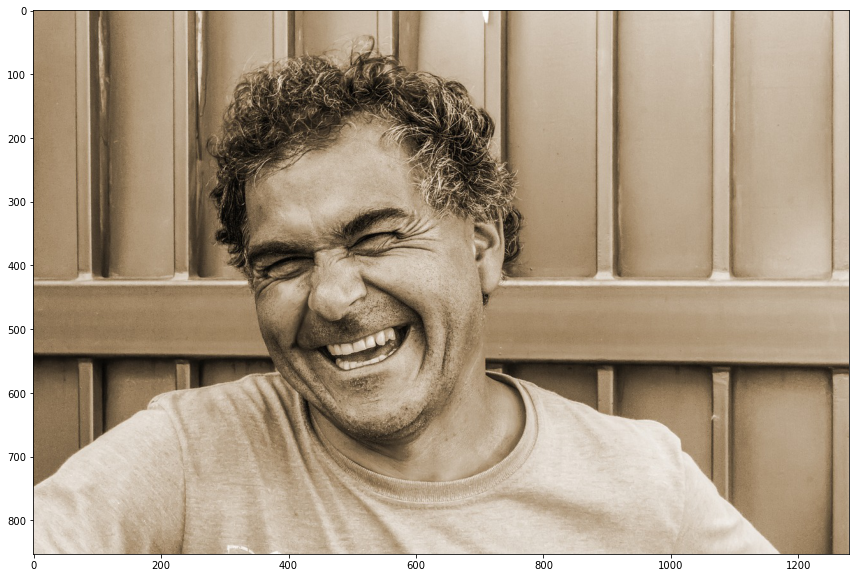

In [127]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_pessoa)

In [128]:
imagem_anotada = imagem_pessoa.copy()

In [129]:
marcos_faciais = pontos_marcos_faciais(imagem_anotada)
imagem_anotada = anotar_marcos_faciais(imagem_anotada, marcos_faciais)

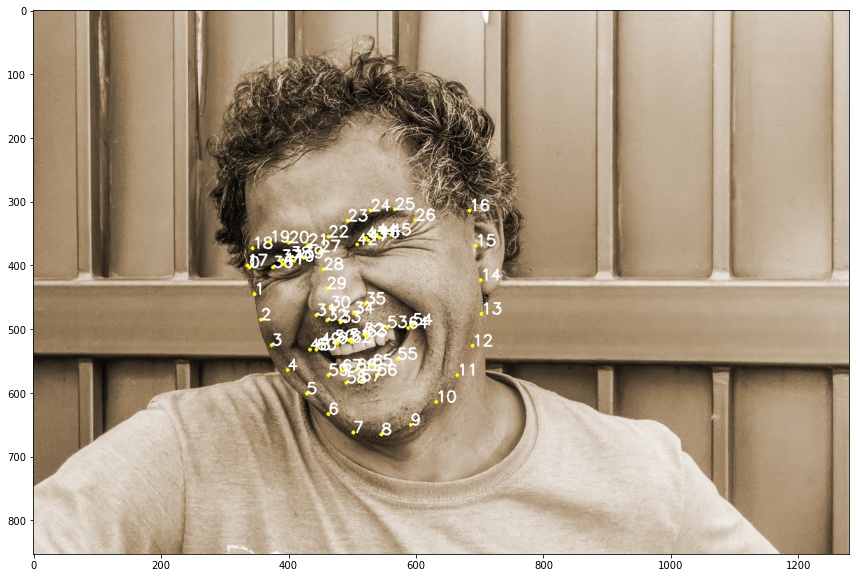

In [130]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_anotada)

## aspecto de razão

In [131]:
FACE = list(range(17,68))
FACE_COMPLETA = list(range(0,68))
LABIO = list(range(48,61))
SOBRANCELHA_DIREITA = list(range(17,22))
SOBRANCELHA_eSQUERDA = list(range(22,27))
OLHO_DIREITO = list(range(36,42))
OLHO_ESQUERDO = list(range(42,48))
NARIZ = list(range(27,35))
MANDIBULA = list(range(0,17))

In [136]:
def aspecto_razao_olhos(pontos_olhos):
    a = dist.euclidean(pontos_olhos[1], pontos_olhos[5])
    b = dist.euclidean(pontos_olhos[2], pontos_olhos[4])
    c = dist.euclidean(pontos_olhos[0], pontos_olhos[3])
    
    aspecto_razao = (a + b) / (2 * c)
    return aspecto_razao

In [139]:
def anotar_marcos_carca_convexa(imagem, marcos):
    retangulos = detector_face(imagem,1)
    if len(retangulos) == 0:
        return None
    
    for idx, ret in enumerate(retangulos):
        marco = marcos[idx]
        
        pontos = cv2.convexHull(marco[OLHO_ESQUERDO])
        cv2.drawContours(imagem, [pontos], 0, (0,255,0), 2)
        
        pontos = cv2.convexHull(marco[OLHO_DIREITO])
        cv2.drawContours(imagem, [pontos], 0, (0,255,0), 2)
    
    return imagem

In [140]:
imagem_anotada = imagem_pessoa.copy()
imagem_anotada = anotar_marcos_carca_convexa(imagem_anotada, marcos_faciais)

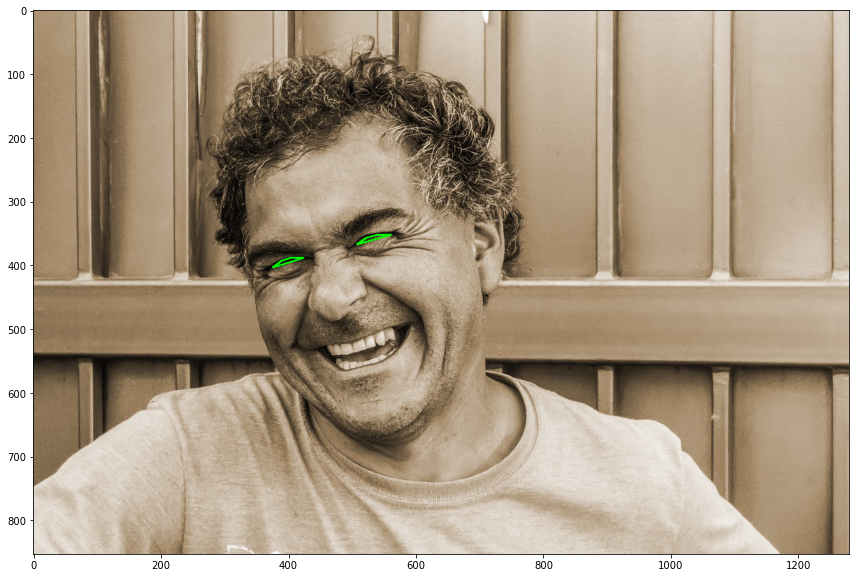

In [141]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_anotada)

In [142]:
valor_olho_esquerdo = aspecto_razao_olhos(marcos_faciais[0][OLHO_ESQUERDO])
valor_olho_direito = aspecto_razao_olhos(marcos_faciais[0][OLHO_DIREITO])

In [143]:
valor_olho_esquerdo

0.10269923319261938

In [144]:
valor_olho_direito

0.13396715136722953

In [145]:
imagem_pessoa_seria = cv2.imread('imagens/px-man-serious.jpg')
imagem_pessoa_seria = cv2.cvtColor(imagem_pessoa_seria, cv2. COLOR_BGR2RGB)

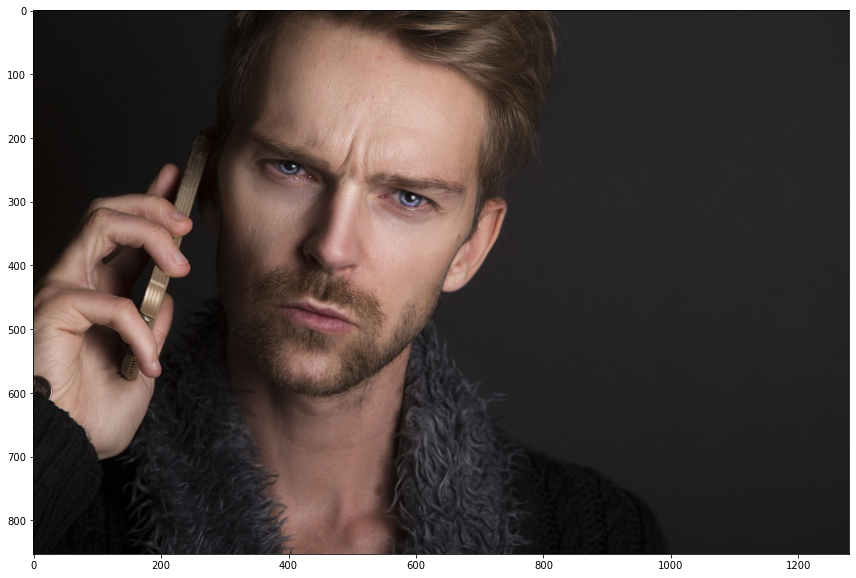

In [146]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_pessoa_seria)

In [147]:
marcos_faciais = pontos_marcos_faciais(imagem_pessoa_seria)

In [148]:
imagem_anotada = imagem_pessoa_seria.copy()

In [149]:
imagem_anotada = anotar_marcos_carca_convexa(imagem_anotada, marcos_faciais)

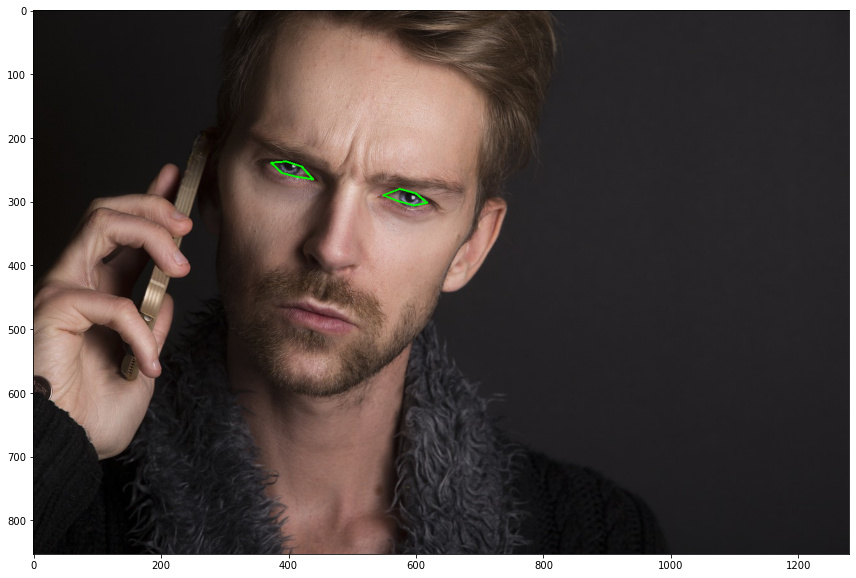

In [150]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_anotada)

In [151]:
valor_olho_esquerdo = aspecto_razao_olhos(marcos_faciais[0][OLHO_ESQUERDO])
valor_olho_direito = aspecto_razao_olhos(marcos_faciais[0][OLHO_DIREITO])

In [152]:
valor_olho_esquerdo

0.2746511084931829

In [153]:
valor_olho_direito

0.2622183488068983

### dlib video

In [18]:
from io import BytesIO
from IPython.display import clear_output, Image, display
from PIL import Image as Img

def padronizar_imagem(imagem):
    imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
    imagem = cv2.resize(imagem, (800,600))
    return imagem

def exibir_video(frame):
    img = Img.fromarray(frame, "RGB")
    buffer = BytesIO()
    img.save(buffer, format="JPEG")
    display(Image(data=buffer.getvalue()))
    clear_output(wait=True)

In [19]:
captura_video = cv2.VideoCapture(0)

try:
    while(True):
        captura_ok, frame = captura_video.read()

        if captura_ok:
            frame = padronizar_imagem(frame)
            exibir_video(frame)

except KeyboardInterrupt:
    captura_video.release()
    print("Interrompido")

Interrompido


In [20]:
classificador_dlib_68_pontos = "classificadores/shape_predictor_68_face_landmarks.dat"
classificador_dlib = dlib.shape_predictor(classificador_dlib_68_pontos)
detector_face = dlib.get_frontal_face_detector()

In [21]:
def pontos_marcos_faciais(imagem):
    retangulos = detector_face(imagem, 1)

    if len(retangulos) == 0:
        return None

    marcos = []

    for retangulo in retangulos:
        marcos.append(np.matrix([[p.x, p.y] for p in classificador_dlib(imagem, retangulo).parts()]))

    return marcos

In [22]:
def anotar_marcos_faciais(imagem, marcos_faciais):
    if imagem is None:
        return im

    for marco in marcos_faciais:
        for idx, ponto in enumerate(marco):
            centro = (ponto[0, 0], ponto[0, 1])
            cv2.circle(imagem, centro, 3, color=(255, 255, 0), thickness=-1)
    return imagem

In [23]:
captura_video = cv2.VideoCapture(0)

try:
    while(True):
        captura_ok, frame = captura_video.read()

        if captura_ok:
            frame = padronizar_imagem(frame)
            pontos = pontos_marcos_faciais(frame)
            frame = anotar_marcos_faciais(frame, pontos)
            exibir_video(frame)

except KeyboardInterrupt:
    captura_video.release()
    print("Interrompido")

Interrompido


In [24]:
FACE = list(range(17, 68))
FACE_COMPLETA = list(range(0, 68))
LABIO = list(range(48, 61))
SOMBRANCELHA_DIREITA = list(range(17, 22))
SOMBRANCELHA_ESQUERDA = list(range(22, 27))
OLHO_DIREITO = list(range(36, 42))
OLHO_ESQUERDO = list(range(42, 48))
NARIZ = list(range(27, 35))
MANDIBULA = list(range(0, 17))

In [25]:
def aspecto_razao_boca(pontos_boca):
    a = dist.euclidean(pontos_boca[3], pontos_boca[9])
    b = dist.euclidean(pontos_boca[2], pontos_boca[10])
    c = dist.euclidean(pontos_boca[4], pontos_boca[8])
    d = dist.euclidean(pontos_boca[0], pontos_boca[6])
    aspecto_razao = (a + b + c)/(3.0 * d)
    return aspecto_razao

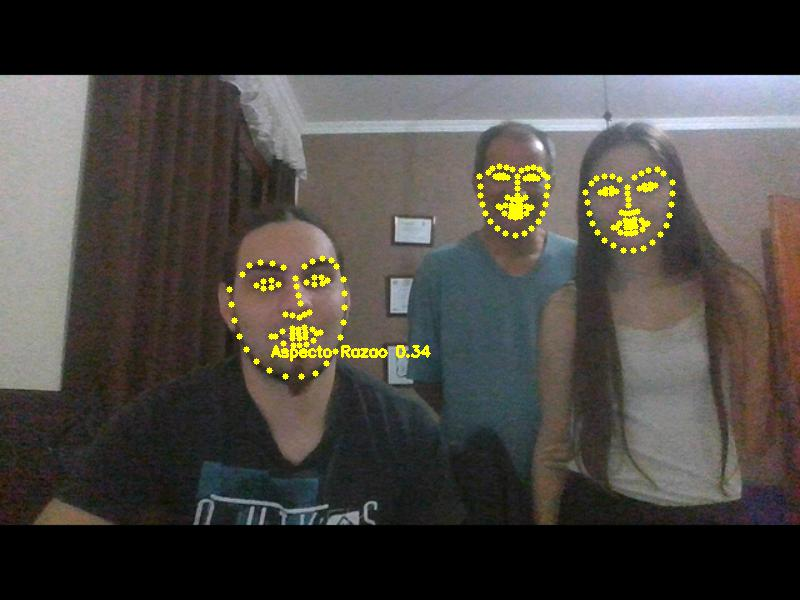

In [ ]:
captura_video = cv2.VideoCapture(0)

try:
    while(True):
        captura_ok, frame = captura_video.read()

        if captura_ok:
            frame = padronizar_imagem(frame)
            pontos = pontos_marcos_faciais(frame)
            if pontos is not None:
                frame = anotar_marcos_faciais(frame, pontos)
                pontos = pontos[0]
                ar = aspecto_razao_boca(pontos[LABIO])
                ar = round(ar,3)
                coord = tuple(pontos[LABIO][0].A1.reshape(1, -1)[0])
                coord = (coord[0], coord[1] + 20)
                cv2.putText(frame, "Aspecto Razao " + str(ar), coord, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)

            exibir_video(frame)

except KeyboardInterrupt:
    captura_video.release()
    print("Interrompido")

In [165]:
if ar > 0.5:
                    (x, y, w, h) = cv2.boundingRect(pontos[LABIO])
                    frame = cv2.rectangle(frame, (x,y), (x+w,y+h), (255,255,0), 2)

In [166]:
captura_video = cv2.VideoCapture(0)

try:
    while(True):
        captura_ok, frame = captura_video.read()

        if captura_ok:
            frame = padronizar_imagem(frame)
            pontos = pontos_marcos_faciais(frame)
            if pontos is not None:
                frame = anotar_marcos_faciais(frame, pontos)
                pontos = pontos[0]
                ar = aspecto_razao_boca(pontos[LABIO])
                ar = round(ar,3)

                if ar > 0.5:
                    (x, y, w, h) = cv2.boundingRect(pontos[LABIO])
                    frame = cv2.rectangle(frame, (x,y), (x+w,y+h), (255,255,0), 2)

                coord = tuple(pontos[LABIO][0].A1.reshape(1, -1)[0])
                coord = (coord[0], coord[1] + 20)
                cv2.putText(frame, "Aspecto Razao " + str(ar), coord, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)

            exibir_video(frame)

except KeyboardInterrupt:
    captura_video.release()
    print("Interrompido")

Interrompido


# Aula 6 aplicações de analise facial - trabalhando com vídeos

In [12]:
def padronizar_imagem(frame):
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    frame = cv2.resize(frame, (500,400))
    
    return frame

In [13]:
def exibir_video(frame):
    img = Img.fromarray(frame, 'RGB')
    buffer = BytesIO()
    img.save(buffer, format='JPEG')
    display(Image(data=buffer.getvalue()))
    clear_output(wait=True)

In [14]:
video = cv2.VideoCapture(0)

try:
    while(True):
        captura_ok, frame = video.read()
        if captura_ok:
            frame = padronizar_imagem(frame)
            exibir_video(frame)
            
except KeyboardInterrupt:
    video.release()
    print('Interrompido')

Interrompido


In [15]:
def aspecto_razao_boca(pontos_boca):
    a = dist.euclidean(pontos_boca[3], pontos_boca[9])
    b = dist.euclidean(pontos_boca[2], pontos_boca[10])
    c = dist.euclidean(pontos_boca[4], pontos_boca[8])
    d = dist.euclidean(pontos_boca[0], pontos_boca[6])
    aspecto_razao = (a + b + c)/(3.0 * d)
    return aspecto_razao

In [16]:
def anotar_marcos_carca_convexa_boca(imagem, marcos):
    retangulos = detector_face(imagem,1)
    if len(retangulos) == 0:
        return None
    
    for idx, ret in enumerate(retangulos):
        marco = marcos[idx]
        
        pontos = cv2.convexHull(marco[LABIO])
        cv2.drawContours(imagem, [pontos], 0, (0,255,0), 2)
    
    return imagem

In [17]:
try:
    ar_max = 0 
    video = cv2.VideoCapture(0)
    while(True):
        captura_ok, frame = video.read()
        if captura_ok:
            frame = padronizar_imagem(frame)
            marcos_faciais = pontos_marcos_faciais(frame)
            
            if marcos_faciais is not None:
                ar_boca = aspecto_razao_boca(marcos_faciais[0][LABIO])
                ar_boca = round(ar_boca, 3)
                if ar_boca > ar_max:
                    ar_max = ar_boca
                    
                info = 'boca' + str(ar_boca) + ' máxmimo ' + str(ar_max)
                
                frame = anotar_marcos_carca_convexa_boca(frame, marcos_faciais)
                
                cv2.putText(frame, info, (20,50), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)
                
        exibir_video(frame)
        
except KeyboardInterrupt:
    video.release()
    print('Interrompido')

NameError: name 'pontos_marcos_faciais' is not defined